# SOLO and FPN (Instance Segmentation)

The SOLO paper: https://arxiv.org/pdf/1912.04488.pdf


In [1]:
# download data, you can maunally download dataset set here:
# https://drive.google.com/drive/folders/1eP7FtPaWfJ5zLdcsZYl6eyn5EYixkFn8

!gdown --id 1JD3OaHpq_4KCb7ofcPMkknmdEXFHrCcn
!gdown --id 1ssRA7yijGLFmJU-ac-lPyUOq7DYzTAS1
!gdown --id 1Rpz-ZuQxDwvLyzc0FD9GZxAKlyka3VC5
!gdown --id 1ouMFNT1thia8l6P5vcWCY-nweAexLDsB
!pip install pytorch-lightning

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1JD3OaHpq_4KCb7ofcPMkknmdEXFHrCcn
To: /content/hw3_mycocodata_mask_comp_zlib.h5
100% 4.30M/4.30M [00:00<00:00, 309MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1ssRA7yijGLFmJU-ac-lPyUOq7DYzTAS1
To: /content/hw3_mycocodata_labels_comp_zlib.npy
100% 269k/269k [00:00<00:00, 159MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloa

## Code Structure
In this assignment, we are only providing the barest templates for your code structure. If you prefer, you can write and debug most of the components in a regular python and only use Jupyter to train. In this case, you might have several files that you import into this notebook, e.g.
* `dataset.py`
* `model.py`
* `train.py`
* `inference.py`

This is shown below. All files should be included in your submission.

In [ ]:
try:
    import dataset
    import model
    import train
    import inference
except ModuleNotFoundError:
    pass

IndentationError: ignored

## Overview

Instance segmentation can be thought of as a combination of object detection and semantic segmentation, the former of which you already explored in the previous project. A visulization of this relationship can be seen in fig. 1.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig1.png" width=500/></div>
<center>Figure 1: An overview of instance segmentation.</center>  

In this project, you are tasked with implementing an instance segmentation framework know as SOLO (Segmenting Object by LOcations). In a similar manner to YOLO, SOLO produces mask predictions on a dense grid. This means that, unlike many other segmenation frameworks (e.g. Mask-RCNN), SOLO directly predicts the segmentation mask without proposing bounding box locations. An visual summary of SOLO can be seen in fig. 2 and 3.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig2.png" width=200/></div>
<center>Figure 2: SOLO.</center>  

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig3.png" width=600/></div>
<center>Figure 3: SOLO branches.</center>

These dense predictions are produced at several different scales using a Feature Pyramid Network (FPN). Using the last few layers of the backbone, we pass the higher level features from the deeper layers back up to larger features scales using lateral connections, shown in fig. 4. The integration of the FPN into your network will be the primary focus of this project.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig4.png" width=300/></div>
<center>Figure 4: SOLO branches.</center>

## Part A

### Dataset
#### Dataset Structure
The dataset used in this project contains three classes across 3265 images: vehicles, people, and animals. The dataset contains the following elements:

* A numpy array of images ($3 \times 300 \times 400$).
* A numpy array of masks ($300 \times 400$).
* A list of ground truth labels by image.
* A list of bounding boxes by image.

Note that the mask array is flattened; to determine which masks belong to which image, count the number of labels associated with that image. For example, if the first few images have 3, 2, and 4 labels, masks 0-2 would belong to image 1, masks 3-4 would belong to image 2, etc. The masks are ordered correctly to allow for this.

#### Loading and Batching
You should apply the following transformations to each image:
* Normalize pixel values to $[0,1]$.
* Rescale the image to $800 \times 1066$.
* Normalize each channel with means $[0.485, 0.456, 0.406]$ and standard deviations $[0.229, 0.224, 0.225]$.
* Zero pad the image to $800 \times 1088$.

Since each image will have a different number of objects, you will have to write your own collation function to properly batch the images. An example collate_fn is shown below, along with expected output dimensions.

In [ ]:
# images:         (batch_size, 3, 800, 1088)
# labels:         list with len: batch_size, each (n_obj,)
# masks:          list with len: batch_size, each (n_obj, 800,1088)
# bounding_boxes: list with len: batch_size, each (n_obj, 4)
def collate_fn(batch):
    images, labels, masks, bounding_boxes = list(zip(*batch))
    return torch.stack(images), labels, masks, bounding_boxes

#### Visualization
In order to validate that you are loading the dataset correct, you should plot at least five example images that include the mask, annotations, and bounding boxes. Examples of such images are shown in fig. 5 and 6. Make sure that the color for each class is consistent!

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig5.png" width=500/></div>
<center>Figure 5: Example visualization.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig6.png" width=500/></div>
<center>Figure 6: Example visualization.</center>

### Model
#### Architecture
The model architecture is summarized in fig. 7 and tables 1 and 2.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig7.png" width=500/></div>
<center>Figure 7: SOLO branch structure.</center>
<br>
<center>Table 1: Category branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 3\times3\times(C-1)$, stride $= 1$, pad $= 1$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note $C = 4$ here (number of classes + background). |

<br>
<center>Table 2: Mask branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times(256 + 2)$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Two additional input channels represent the $x$ and $y$ positional encoding. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 1\times1\times(\text{num_grid})^2$, stride $= 1$, pad $= 0$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note that $\text{num_grid}$ is different for each layer of the FPN. |

We will be using a pretrained backbone (which includes an FPN), so you will not have to implement those components. A template for the network with along with default parameters is shown below.

#### Feature Pyramid
The feature pyramid extracted below has strides $[4,8,16,32,64]$ over the original image. To match the SOLO paper, this should be interpolated to have strides $[8,8,16,32,32]$.

#### Target Assignment
Some notes about generating the ground truth targets:
* The FPN levels can be though of as different grid sizes cut through the image.
* You assign each target to a certain FPN level if $\sqrt{wh}$ from the bounding box falls within the `scale_range` associated with that level. Note that these overlap, so you may assign the same target to multiple levels.
* A grid cell should be considered as predicting an object if that grid cell falls into the "centre region" of the object.
 * The centre region of an object is its bounding box scaled by `epsilon`.
 * Each grid cell can predict at most one object, but each object can be predicted by more than one grid cell.

#### Target Visualization
You should produce visualizations such as fig. 8 and 9 to validate your target assignments.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig8.png" width=500/></div>
<center>Figure 8: Target assignment example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig9.png" width=500/></div>
<center>Figure 9: Target assignment example.</center>

In [3]:
from typing import Any
import pytorch_lightning as pl
from pytorch_lightning.utilities.types import STEP_OUTPUT
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import gc
import datetime
import logging
from logging.handlers import TimedRotatingFileHandler
import os
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torchvision
import numpy as np
import math
import h5py
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torchvision import transforms, utils
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from matplotlib import patches, text, patheffects
import torch.nn as nn
import pytorch_lightning as pl
from matplotlib import pyplot as plt
import gc
from pytorch_lightning import loggers as pl_loggers
from pytorch_lightning import callbacks as pl_callbacks
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.core.datamodule import LightningDataModule
from torch.utils.data import random_split, DataLoader
import torchvision.transforms as transforms

In [2]:
class BuildDataset(torch.utils.data.Dataset):
    def __init__(self, path):
        # main_logger.info( f"Initialising BuildDataset..." )

        # Unpack paths
        self.images_path, self.masks_path, self.labels_path, self.bboxes_path = path

        # Load dataset
        self.img_dataset = h5py.File(self.images_path, 'r')['data']
        # main_logger.info(f"Loaded image data. Shape: {self.img_dataset.shape}")

        self.mask_dataset = h5py.File(self.masks_path, 'r')['data']
        # main_logger.info(f"Loaded masks data. Shape: {self.mask_dataset.shape}")

        self.label_dataset = np.load(self.labels_path, allow_pickle=True)
        # main_logger.info(f"Loaded labels data. Shape: {self.label_dataset.shape}")

        self.bbox_dataset = np.load(self.bboxes_path, allow_pickle=True)
        # main_logger.info(f"Loaded bounding boxes. Shape: {self.bbox_dataset.shape}")

        # Normalization transformation
        self.norm_transform = transforms.Normalize(
            (0.485, 0.456, 0.406),
            (0.229, 0.224, 0.225)
        )

        # Prepare masks per image
        self.masks_per_image = []
        counter = 0
        # Iterate over each label in the label dataset
        for label in self.label_dataset:
            # Extract the masks for the current image based on the number of labels it has
            end = counter + len(label)
            masks_for_image = self.mask_dataset[counter:end]
            # Update the counter
            counter = end
            # Append the masks for the current image to the main list
            self.masks_per_image.append(masks_for_image)
        # main_logger.info(f"Prepared masks per image. Total: {len(self.masks_per_image)}")

    def __getitem__(self, index):

        # Extract data for the given index
        image = self.img_dataset[index]
        masks = self.masks_per_image[index]
        label = torch.tensor(self.label_dataset[index], dtype=torch.float)
        bbox = self.bbox_dataset[index]

        # Pre-process data
        processed_img, processed_masks, processed_bbox = self.pre_process_batch(image, masks, bbox)

        # check flag
        assert processed_img.shape == (3, 800, 1088)
        assert processed_bbox.shape[0] == processed_masks.shape[0]

        return processed_img, label, processed_masks, processed_bbox

    def __len__(self):
        return len(self.img_dataset)

    def pre_process_batch(self, img, masks, bbox):
        # Image preprocessing
        img_tensor = torch.tensor(img.astype(np.float), dtype=torch.float) / 255.0
        img_tensor = torch.unsqueeze(img_tensor, 0)
        img_tensor = F.interpolate(img_tensor, size=(800, 1066), mode='bilinear')
        img_tensor = self.norm_transform(img_tensor[0])
        img_tensor = F.pad(img_tensor, pad=(11, 11), mode='constant', value=0)
        # main_logger.debug(f"Processed image shape: {img_tensor.shape}")

        # Mask preprocessing
        mask_tensors = torch.zeros((len(masks), 3, 800, 1088))
        for i, mask in enumerate(masks):
            mask_tensor = torch.tensor(mask.astype(np.uint8), dtype=torch.float)
            mask_tensor = torch.unsqueeze(mask_tensor, 0)
            mask_tensor = torch.cat(3 * [mask_tensor])
            mask_tensor = torch.unsqueeze(mask_tensor, 0)
            mask_tensor = F.interpolate(mask_tensor, size=(800, 1066), mode='bilinear')
            mask_tensor = F.pad(mask_tensor, pad=(11, 11), mode='constant', value=0)
            mask_tensor[mask_tensor > 0.5] = 1
            mask_tensor[mask_tensor < 0.5] = 0
            mask_tensors[i] = mask_tensor[0, 0, :, :]
        # main_logger.debug(f"Processed masks shape: {mask_tensors.shape}")

        # Bounding box preprocessing
        bbox_tensor = torch.tensor(bbox, dtype=torch.float)
        bbox_tensor[:, 0] = bbox_tensor[:, 0] * 800 / 300
        bbox_tensor[:, 2] = bbox_tensor[:, 2] * 800 / 300
        bbox_tensor[:, 1] = bbox_tensor[:, 1] * 1066 / 400
        bbox_tensor[:, 3] = bbox_tensor[:, 3] * 1066 / 400
        bbox_tensor[:, 0] += 11
        bbox_tensor[:, 2] += 11
        # main_logger.debug(f"Processed bbox shape: {bbox_tensor.shape}")

        # check flag
        assert img_tensor.shape == (3, 800, 1088)
        assert bbox_tensor.shape[0] == mask_tensors.shape[0]

        return img_tensor, mask_tensors, bbox_tensor

In [3]:
class BuildDataLoader(torch.utils.data.DataLoader):
    def __init__(self, dataset, batch_size, shuffle, num_workers):
        """Initializes the custom data loader."""
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.num_workers = num_workers

    def collect_fn(self, batch):
        """
        Custom collate function to process batches of data.

        Args:
        - batch (list): List of data samples.

        Returns:
        - images (torch.Tensor): Batch of images.
        - labels (list): List of labels.
        - masks (list): List of masks.
        - bboxes (list): List of bounding boxes.
        """
        # Extract data from the batch
        images, labels, masks, bboxes = zip(*batch)

        # Convert list of images to a tensor
        images = torch.stack(images, dim=0)

        return images, list(labels), list(masks), list(bboxes)

    def loader(self):
        """Creates and returns the DataLoader."""
        return torch.utils.data.DataLoader(
            self.dataset,
            batch_size=self.batch_size,
            shuffle=self.shuffle,
            num_workers=self.num_workers,
            collate_fn=self.collect_fn
        )

<ipython-input-2-ecde770edccd>:63: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img_tensor = torch.tensor(img.astype(np.float), dtype=torch.float) / 255.0
<ipython-input-12-5947297a2c81>:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


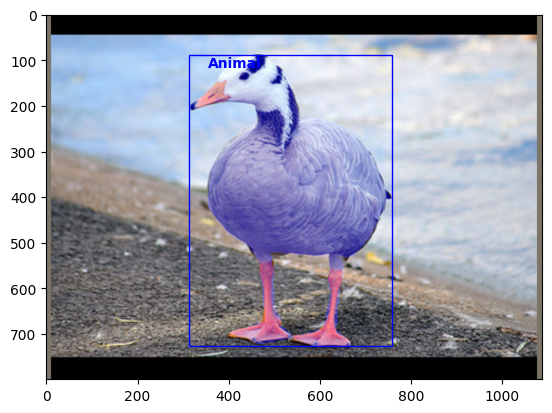

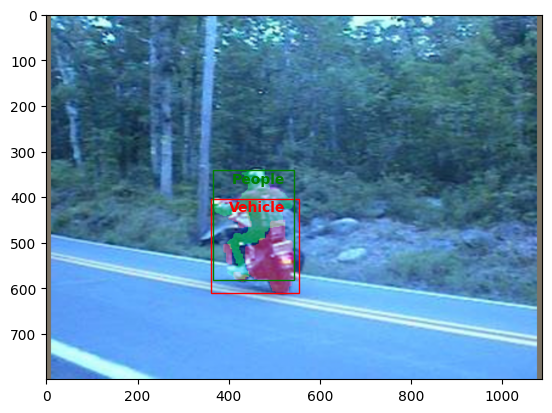

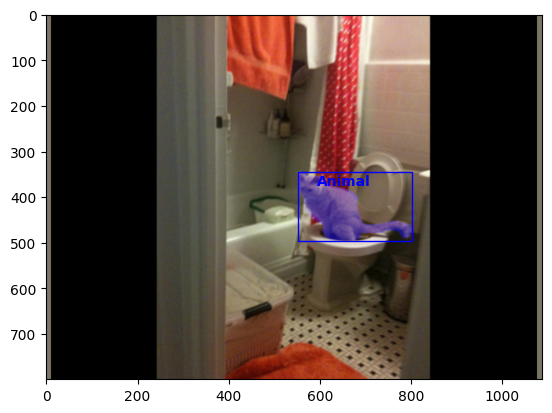

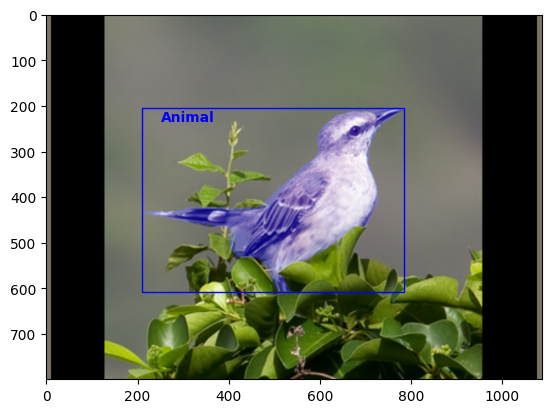

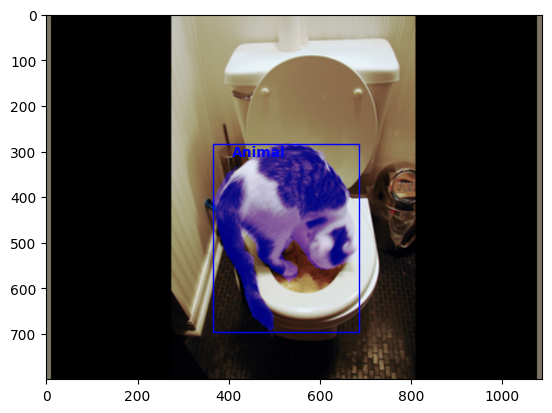

...

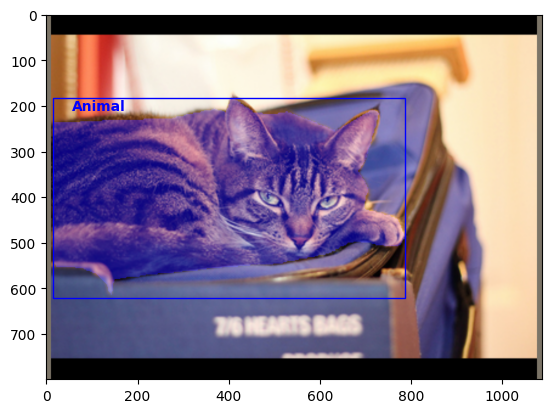

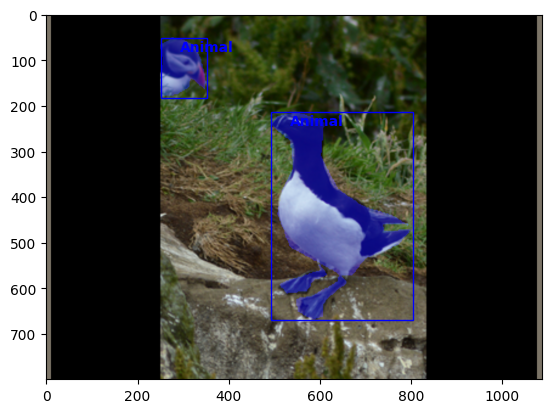

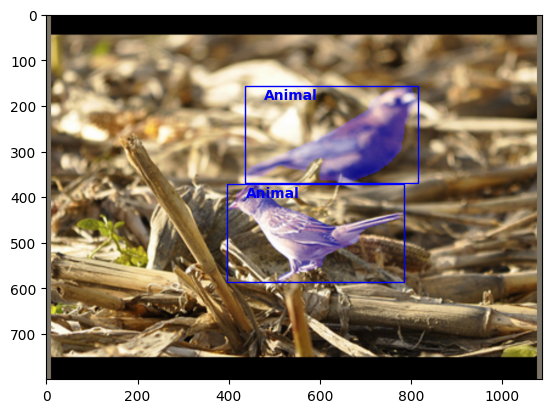

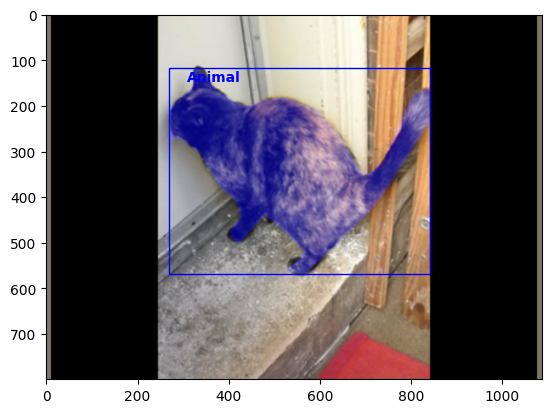

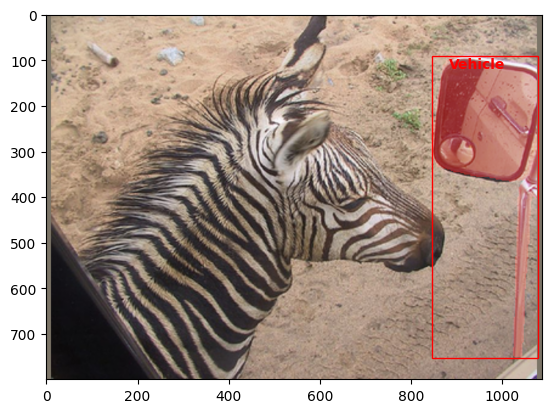

In [12]:
### RUN THIS CELL TO VISUALIZE THE BOUNDING BOXES AND MASKS

# Define paths
imgs_path = './data/hw3_mycocodata_img_comp_zlib.h5'
masks_path = './data/hw3_mycocodata_mask_comp_zlib.h5'
labels_path = './data/hw3_mycocodata_labels_comp_zlib.npy'
bboxes_path = './data/hw3_mycocodata_bboxes_comp_zlib.npy'
paths = [imgs_path, masks_path, labels_path, bboxes_path]

# Load dataset
dataset = BuildDataset(paths)

# Split dataset into training and test sets
full_size = len(dataset)
train_size = int(full_size * 0.8)
test_size = full_size - train_size
torch.random.manual_seed(1)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

# Create data loaders
batch_size = 2
train_loader = BuildDataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0).loader()
test_loader = BuildDataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0).loader()

mask_color_list = ["jet", "ocean", "Spectral", "spring", "cool"]

# Define device
device = torch.device("cuda:0" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")

# Define inverse transformation for visualization
inverse_transformation = transforms.Compose([
transforms.Normalize(mean=[0., 0., 0.], std=[1/0.229, 1/0.224, 1/0.225]),
transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1., 1., 1.])
])

# Visualize data
for iter_num, (img_batch, label_batch, mask_batch, bbox_batch) in enumerate(train_loader):

    assert img_batch.shape == (batch_size, 3, 800, 1088)
    assert len(mask_batch) == batch_size

    # Move data to device
    label_batch = [label.to(device) for label in label_batch]
    mask_batch = [mask.to(device) for mask in mask_batch]
    bbox_batch = [bbox.to(device) for bbox in bbox_batch]

    for i in range(batch_size):
        combined_mask = np.zeros((800, 1088, 3))
        fig, ax = plt.subplots()

        for j, label in enumerate(label_batch[i]):
            bbox_coords = bbox_batch[i][j].cpu().numpy()
            xA, yA, xB, yB = bbox_coords

            # Define colors for different labels
            color_map = {1: 'r', 2: 'g', 3: 'b'}
            annotate_map = {1: 'Vehicle', 2: 'People', 3: 'Animal'}
            rect = patches.Rectangle((xA, yA), xB-xA, yB-yA, linewidth=1, edgecolor=color_map[label.item()], facecolor='none')
            ax.add_patch(rect)
            rx, ry = rect.get_xy()
            ax.annotate(annotate_map[label.item()], (rx + 100, ry + 20), color=color_map[label.item()], weight='bold', fontsize=10, ha='center', va='center')

            # Update combined mask
            combined_mask[:, :, int(label.item()-1)] += (mask_batch[i][j, int(label.item()-1,), :, :] * 255).cpu().numpy()

        # Display the image with masks
        original_img = inverse_transformation(img_batch[i]).numpy().transpose(1, 2, 0)
        mask_overlay = combined_mask + (original_img * (1 - (combined_mask / 255)) * 255)
        ax.imshow(original_img)
        ax.imshow(np.uint8(mask_overlay), alpha=0.5)
        # plt.savefig(f"./testfig/visualtrainset{iter_num}.png")
        plt.show()

    if iter_num == 10:
        break

In [6]:
class SOLO(pl.LightningModule):
    _default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5)
    }

    def __init__(self, **kwargs):
        super().__init__()
        for k, v in {**self._default_cfg, **kwargs}.items():
            setattr(self, k, v)

        pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=True)
        self.backbone = pretrained_model.backbone
        ...

    # Forward function should calculate across each level of the feature pyramid network.
    # Input:
    #     images: batch_size number of images
    # Output:
    #     if eval = False
    #         category_predictions: list, len(fpn_levels), each (batch_size, C-1, S, S)
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, 2*feature_h, 2*feature_w)
    #     if eval==True
    #         category_predictions: list, len(fpn_levels), each (batch_size, S, S, C-1)
    #         / after point_NMS
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, image_h/4, image_w/4)
    #         / after upsampling
    def forward(self, images, eval=True):
        # you can modify this if you want to train the backbone
        feature_pyramid = [v.detach() for v in self.backbone(images).values()] # this has strides [4,8,16,32,64]
        ...

    # This function build the ground truth tensor for each batch in the training
    # Input:
    #     bounding_boxes:   list, len(batch_size), each (n_object, 4) (x1 y1 x2 y2 system)
    #     labels:           list, len(batch_size), each (n_object, )
    #     masks:            list, len(batch_size), each (n_object, 800, 1088)
    # Output:
    #     category_targets: list, len(batch_size), list, len(fpn), (S, S), values are {1, 2, 3}
    #     mask_targets:     list, len(batch_size), list, len(fpn), (S^2, 2*feature_h, 2*feature_w)
    #     active_masks:     list, len(batch_size), list, len(fpn), (S^2,)
    #     / boolean array with positive mask predictions
    def generate_targets(self, bounding_boxes, labels, masks):

        category_targets, mask_targets, active_masks = [], [], []
        img_dim = (800, 1088)

        for boxes, lbls, mask in zip(bounding_boxes, labels, masks):

            # Calculate width, height, area, and centers
            widths = boxes[:, 2] - boxes[:, 0]
            heights = boxes[:, 3] - boxes[:, 1]
            areas = torch.sqrt(widths * heights)
            centers_x = (boxes[:, 2] + boxes[:, 0]) / 2
            centers_y = (boxes[:, 3] + boxes[:, 1]) / 2

            # Scaled centers and dimensions
            centers_x_scaled = [centers_x * (grid / img_dim[1]) for grid in self.num_grids]
            centers_y_scaled = [centers_y * (grid / img_dim[0]) for grid in self.num_grids]
            widths_scaled = [widths * (grid / img_dim[1]) for grid in self.num_grids]
            heights_scaled = [heights * (grid / img_dim[0]) for grid in self.num_grids]

            levels = [torch.logical_and(self.scale_ranges[i][0] < areas, areas < self.scale_ranges[i][1]).int() for i in range(5)]

            img_category_targets, img_mask_targets, img_active_masks = [], [], []

            for level_id, level in enumerate(levels):
                height_by_stride, width_by_stride = img_dim[0] // self.strides[level_id], img_dim[1] // self.strides[level_id]
                scaled_mask = F.interpolate(mask.unsqueeze(0), size=(2*height_by_stride, 2*width_by_stride), mode='nearest').squeeze(0).to('cpu')

                cat_target = torch.zeros(self.num_grids[level_id], self.num_grids[level_id]).to('cpu')
                mask_target = torch.zeros(self.num_grids[level_id]**2, 2*height_by_stride, 2*width_by_stride).to('cpu')
                active_mask = torch.zeros(self.num_grids[level_id]**2).to('cpu')

                for label_id, is_active in enumerate(level):
                    if is_active.item() == 0:
                        continue

                    # Scale down the boxes and bound them
                    x_tl, y_tl = max(torch.round(centers_x_scaled[level_id][label_id] - 0.2 * widths_scaled[level_id][label_id] / 2), centers_x_scaled[level_id][label_id] - 1).int().item(), max(torch.round(centers_y_scaled[level_id][label_id] - 0.2 * heights_scaled[level_id][label_id] / 2), centers_y_scaled[level_id][label_id] - 1).int().item()
                    x_br, y_br = min(torch.round(centers_x_scaled[level_id][label_id] + 0.2 * widths_scaled[level_id][label_id] / 2), centers_x_scaled[level_id][label_id] + 1).int().item(), min(torch.round(centers_y_scaled[level_id][label_id] + 0.2 * heights_scaled[level_id][label_id] / 2), centers_y_scaled[level_id][label_id] + 1).int().item()

                    mesh_x, mesh_y = torch.meshgrid(torch.arange(y_tl, y_br+1, device='cpu'), torch.arange(x_tl, x_br+1, device='cpu'))

                    cat_target[mesh_x, mesh_y] = lbls[label_id].item()
                    mask_target[mesh_x.flatten()*self.num_grids[level_id] + mesh_y.flatten()] = scaled_mask[label_id]
                    active_mask[mesh_x.flatten()*self.num_grids[level_id] + mesh_y.flatten()] = 1.

                img_category_targets.append(cat_target)
                img_mask_targets.append(mask_target)
                img_active_masks.append(active_mask)

            category_targets.append(img_category_targets)
            mask_targets.append(img_mask_targets)
            active_masks.append(img_active_masks)

        return category_targets, mask_targets, active_masks

In [ ]:
def visualize_targets(msk_tar, act_msk, cat_tar, img):
    """
    Visualize target masks on the given images.

    Parameters:
    - msk_tar: List of target masks
    - act_msk: List of active masks
    - cat_tar: List of category targets
    - img: List of images

    Returns:
    None
    """

    # Define the color mapping for labels
    color_map = {
        3: [1, 0, 0],  # Red for label 3
        2: [0, 1, 0],  # Green for label 2
        1: [0, 0, 1]   # Blue for label 1
    }

    # Iterate over each image and its corresponding masks and targets
    for j, (masks, actives, categories, image) in enumerate(zip(msk_tar, act_msk, cat_tar, img)):
        for i, (mask, active, category) in enumerate(zip(masks, actives, categories)):
            fig, ax = plt.subplots()

            # Display the original image
            image_np = image.cpu().numpy().transpose(1, 2, 0)
            ax.imshow(np.clip(image_np, 0, 1))

            # If no active mask, just show the image
            if active.sum() == 0:
                plt.show()
                continue

            # Get the active masks and their corresponding labels
            active_indices = active > 0
            active_labels = torch.flatten(category)[active_indices]
            active_masks = mask[active_indices]

            # Upscale the mask to match the image dimensions
            reshaped_mask = F.interpolate(active_masks.unsqueeze(1), img.shape[2:], mode='bilinear')

            # Create an empty mask with 3 channels (for RGB)
            combined_mask = np.zeros(img.shape[2:] + (3,))

            # Map each label to its corresponding color
            for idx, label in enumerate(active_labels):
                # print( f"idx: {idx}" )
                # print( f"label: {label.dtype}" )
                # print( f"combined_mask: {combined_mask.shape}")
                # print( f"reshaped_mask[idx]: {reshaped_mask[idx].shape}")
                # print( f"reshaped_mask[idx]: {reshaped_mask[idx].transpose(0,1).transpose(1,2).shape}")
                combined_mask[:, :, :] += reshaped_mask[idx].transpose(0,1).transpose(1,2).cpu().numpy() * color_map[label.item()]

            # Overlay the mask on the original image
            overlay = np.clip(image_np + combined_mask, 0, 1)
            ax.imshow(overlay)
            plt.show()

            # Stop after 10 images
            if j == 10:
                return

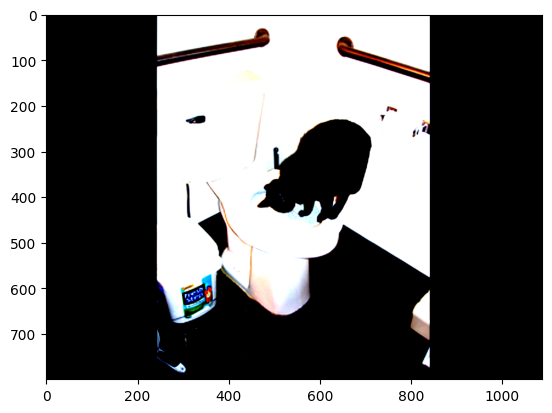

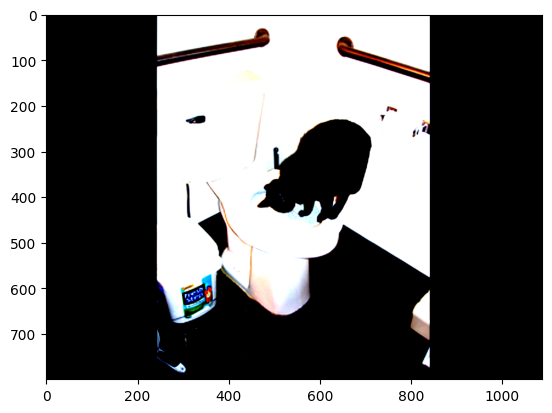

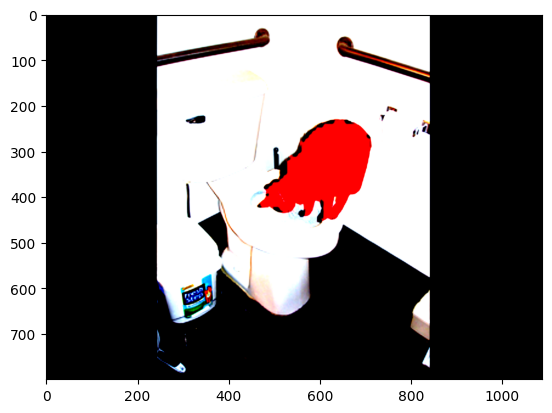

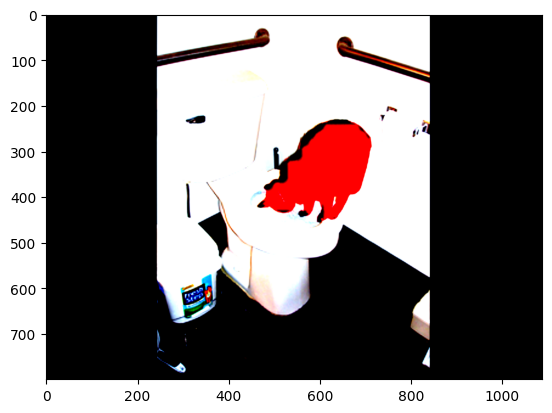

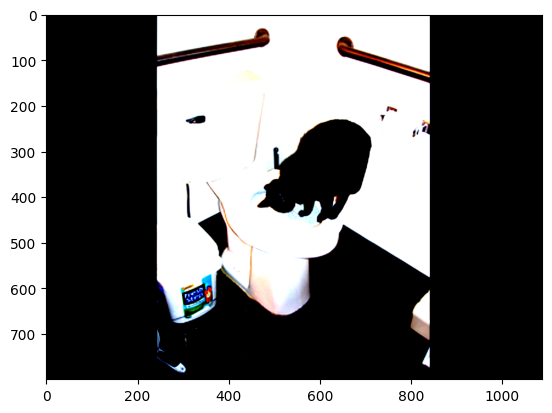

...

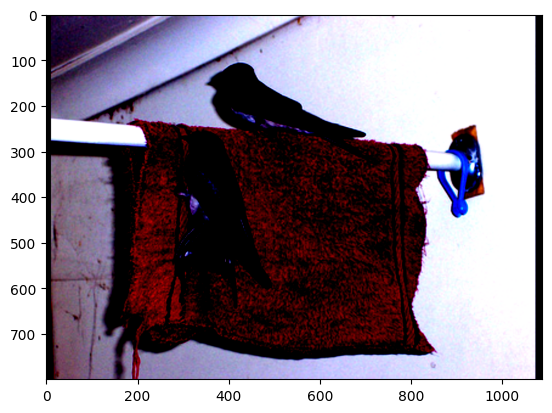

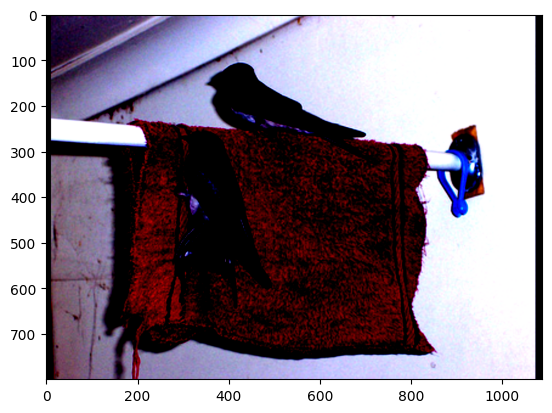

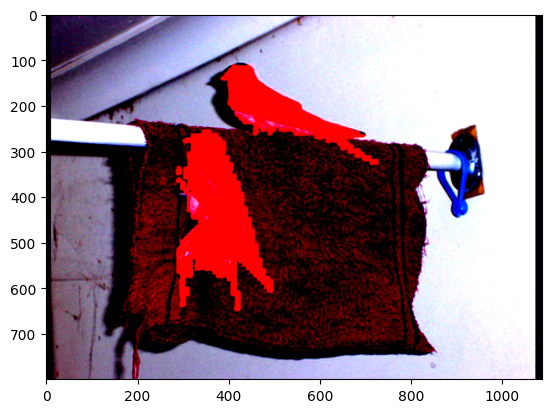

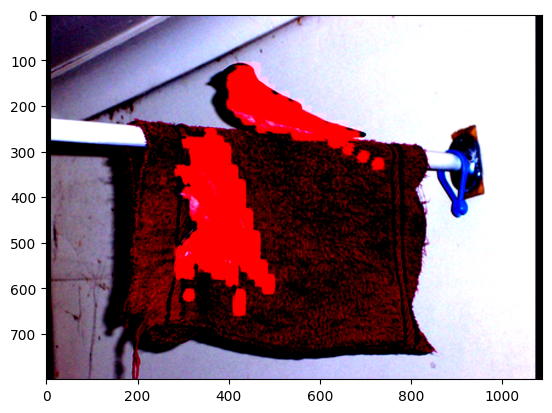

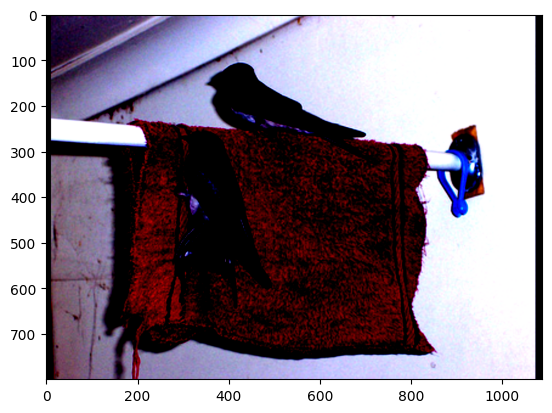

In [11]:
# Define paths
imgs_path = './data/hw3_mycocodata_img_comp_zlib.h5'
masks_path = './data/hw3_mycocodata_mask_comp_zlib.h5'
labels_path = './data/hw3_mycocodata_labels_comp_zlib.npy'
bboxes_path = './data/hw3_mycocodata_bboxes_comp_zlib.npy'
paths = [imgs_path, masks_path, labels_path, bboxes_path]

# Load dataset
dataset = BuildDataset(paths)

target_loader = BuildDataLoader(dataset, batch_size=10, shuffle=False, num_workers=0).loader()
target_images, target_labels, target_masks, target_bounding_boxes = next(iter(target_loader))
target_masks = [m[:, 0, :, :] for m in target_masks]

assigned_target_categories, assigned_target_masks, assigned_target_active_masks = SOLO().generate_targets( target_bounding_boxes[:], target_labels[:], target_masks[:] )

visualize_targets(assigned_target_masks, assigned_target_active_masks, assigned_target_categories, target_images)


### Loss
The loss function consists of two parts: category loss and mask loss:
$$L = \lambda_\text{cate} L_\text{cate} + \lambda_\text{mask} L_\text{mask} $$

The category loss is defined as (where $\text{FL}$ is the focal loss)

$$L_\text{cate} = \frac{1}{S^2 C} \sum_{S,S,C} \text{FL}(p_t)$$

$$\text{FL}(p_t) = -\alpha_t (1 - p_t)^\gamma \log{(p_t)}$$

$$(\alpha_t, p_t) = \left\{\begin{array}{lr} (\alpha, \hat{p}) & \text{if }y=1 \\ (1 - \alpha, 1 - \hat{p}) & \text{otherwise}\end{array}\right.$$

while the mask loss is defined as (where $d_\text{mask}$ is the dice loss)

$$L_\text{mask} = \frac{1}{N_\text{positive}} \sum_k \mathbb{1}_{\{p_{i, j} > 0\}} d_\text{mask}(m_k, \hat{m}_k)$$

$$d_\text{mask}(p, q) = 1 - D(p, q)$$

$$D(p, q) = \frac{2 \sum_{x,y}(p_{x,y} \cdot q_{x,y})}{\sum_{x,y}p_{x,y}^2 + \sum_{x,y}q_{x,y}^2}$$

### Post Processing
Post processing consists of three steps: points NMS, concatenation and sorting, and matrix NMS. A summary of each of these steps is provided below. In addition, your final mask prediction should be a binary mask based on the mask thresholding parameter. Some examples of results post-inference are shown in figs. 11-14.


<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig11.png" width=300/></div>
<center>Figure 11: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig12.png" width=300/></div>
<center>Figure 12: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig13.png" width=300/></div>
<center>Figure 13: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig14.png" width=300/></div>
<center>Figure 14: SOLO instance segmentation example.</center>

#### Points NMS
Non-max suppression for the category predictions, applied to each channel sperately. A maxpooling with a kernel size of 2, sample code is included below.

#### Concatenation and Sorting
Here, we merge the predictions across all the FPN levels into a single list of predictions, sorted by their predicted score. This involves rescaling the predicted masks appropriately.

#### Matrix NMS
Inspired by Soft-NMS, MatrixNMS suppresses mask predictions with a lower score based on their similarity to predictions with a higher score in a completely vectorized manner. Sample code is include below.

In [ ]:
# Credit to SOLO Author's code
# This function does NMS on the heat map (category_prediction), grid-level
# Input:
#     heat: (batch_size, C-1, S, S)
# Output:
#     (batch_size, C-1, S, S)
def points_nms(heat, kernel=2):
    # kernel must be 2
    hmax = F.max_pool2d(
        heat, (kernel, kernel), stride=1, padding=1)
    keep = (hmax[:, :, :-1, :-1] == heat).float()
    return heat * keep

# This function performs Matrix NMS
# Input:
#     sorted_masks: (n_active, image_h/4, image_w/4)
#     sorted_scores: (n_active,)
# Output:
#     decay_scores: (n_active,)
def MatrixNMS(sorted_masks, sorted_scores, method='gauss', gauss_sigma=0.5):
    n = len(sorted_scores)
    sorted_masks = sorted_masks.reshape(n, -1)
    intersection = torch.mm(sorted_masks, sorted_masks.T)
    areas = sorted_masks.sum(dim=1).expand(n, n)
    union = areas + areas.T - intersection
    ious = (intersection / union).triu(diagonal=1)

    ious_cmax = ious.max(0)[0].expand(n, n).T
    if method == 'gauss':
        decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
    else:
        decay = (1 - ious) / (1 - ious_cmax)
    decay = decay.min(dim=0)[0]
    return sorted_scores * decay

### Training
#### Optimizer
The SGD optimizer with a weight decay of 1e-4 and a momentum of 0.9 is used. For a batch size of 16, an initial learning rate of 16 is used (scaled appropriately for different batch sizes). 

<!-- You should train for 36 epochs, reducing the learning rate by a factor of 10 at epochs 27 and 33. -->

<!-- #### Data Augemnetation
To achieve better performance, you may wish to explore some data augmentation techniques. You should be able to achieve the necessary performance without any augmentation, however. -->

<!-- #### Checkpointing
Due to the long training time, we highly recommend that you set up regular checkpointing during your training in case your training gets interrupted (e.g. your colab session ending). -->

In [15]:
class SOLO(pl.LightningModule):
    _default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5),
        'feature_dims': [(200, 272), (200, 272), (100, 136), (50, 68), (50, 68)]
    }

    def __init__(self, **kwargs):
        super().__init__()
        for k, v in {**self._default_cfg, **kwargs}.items():
            setattr(self, k, v)

        # Initialize backbone
        pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=True)
        self.backbone = pretrained_model.backbone

        # Initialize loss and metrics lists
        self.training_losses, self.validation_losses, self.training_categories, self.validation_categories, self.training_masks, self.validation_masks = [], [], [], [], [], []
        self.training_step_outputs, self.validation_step_outputs = [], []

        # Define category branch
        self.category_branch_head = self._make_layers(self.in_channels, self.in_channels, kernel_size=3, padding=1, num_layers=self.stacked_convs)
        self.category_branch_output = nn.Sequential(
            nn.Conv2d(self.in_channels, 3, kernel_size=3, padding=1),
            nn.Sigmoid()
        )

        # Define mask branch
        self.mask_branch_head = self._make_layers(self.in_channels + 2, self.in_channels, kernel_size=3, padding=1, num_layers=self.stacked_convs)
        self.mask_branch_output = nn.ModuleList(
            [nn.Sequential(nn.Conv2d(self.in_channels, grid**2, kernel_size=1), nn.Sigmoid()) for grid in self.num_grids]
        )
        self.mask_branch_output = nn.Sequential(*self.mask_branch_output)

    def _make_layers(self, in_channels, out_channels, kernel_size, padding, num_layers):
        layers = [
            nn.Sequential(
                nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size, padding=padding, bias=False),
                nn.GroupNorm(32, out_channels),
                nn.ReLU(inplace=True)
            ) for i in range(num_layers)
        ]
        return nn.Sequential(*layers)

    def forward_internal(self, layers):
        layer_idx, layer = layers
        size_layer = self.num_grids[layer_idx]
        align = F.interpolate(layer, size=(size_layer, size_layer), mode="bilinear")
        coord_conv = self.add_channels(layer)
        mask_intermediate = self.mask_branch_head(coord_conv)
        mask_intermediate = F.interpolate(mask_intermediate, scale_factor=2, mode="bilinear")
        return self.category_branch_output(self.category_branch_head(align)), self.mask_branch_output[layer_idx](mask_intermediate)

    def add_channels(self, layer):
        x, y = torch.meshgrid(torch.linspace(-1, 1, layer.shape[-2]), torch.linspace(-1, 1, layer.shape[-1]))
        x = x.unsqueeze(0).expand(layer.shape[0], -1, -1, -1)
        y = y.unsqueeze(0).expand(layer.shape[0], -1, -1, -1)
        return torch.cat((layer, x.to(device), y.to(device)), dim=1)

    def forward(self, images, eval_mode=True):
        if eval_mode:
            self.eval()
        else:
            self.train()

        feature_pyramid = [v.detach() for v in self.backbone(images).values()]
        outputs = list(map(self.forward_internal, enumerate(feature_pyramid)))
        category_preds = [out[0] for out in outputs]
        mask_preds = [out[1] for out in outputs]

        if eval_mode:
            with torch.no_grad():
                category_preds = [pred.permute(0, 2, 3, 1) for pred in category_preds]
                mask_preds = [F.interpolate(mask, size=(200, 272)) for mask in mask_preds]

        return category_preds, mask_preds

    def grid_idxs_constrained(self, bbox, label, fpn_grid):
        num_grid = fpn_grid.shape[0]
        h_center, w_center = (bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2
        h_scale, w_scale = self.epsilon * (bbox[2] - bbox[0]), self.epsilon * (bbox[3] - bbox[1])
        h_half, w_half = h_scale / 2, w_scale / 2

        top_idx = max(0, int((h_center - h_half) / 800 * num_grid))
        bottom_idx = min(num_grid - 1, int((h_center + h_half) / 800 * num_grid))
        left_idx = max(0, int((w_center - w_half) / 1088 * num_grid))
        right_idx = min(num_grid - 1, int((w_center + w_half) / 1088 * num_grid))

        center_h, center_w = int(h_center / 800 * num_grid), int(w_center / 1088 * num_grid)
        top, bottom = max(top_idx, center_h - 1), min(bottom_idx, center_h + 1)
        left, right = max(left_idx, center_w - 1), min(right_idx, center_w + 1)

        fpn_grid[top:bottom + 1, left:right + 1] = label
        return fpn_grid, top, bottom, left, right
    
    def generate_targets(self, bounding_boxes, labels, masks):

        category_targets, mask_targets, active_masks = [], [], []
        img_dim = (800, 1088)

        for boxes, lbls, mask in zip(bounding_boxes, labels, masks):

            # Calculate width, height, area, and centers
            widths = boxes[:, 2] - boxes[:, 0]
            heights = boxes[:, 3] - boxes[:, 1]
            areas = torch.sqrt(widths * heights)
            centers_x = (boxes[:, 2] + boxes[:, 0]) / 2
            centers_y = (boxes[:, 3] + boxes[:, 1]) / 2

            # Scaled centers and dimensions
            centers_x_scaled = [centers_x * (grid / img_dim[1]) for grid in self.num_grids]
            centers_y_scaled = [centers_y * (grid / img_dim[0]) for grid in self.num_grids]
            widths_scaled = [widths * (grid / img_dim[1]) for grid in self.num_grids]
            heights_scaled = [heights * (grid / img_dim[0]) for grid in self.num_grids]

            levels = [torch.logical_and(self.scale_ranges[i][0] < areas, areas < self.scale_ranges[i][1]).int() for i in range(5)]

            img_category_targets, img_mask_targets, img_active_masks = [], [], []

            for level_id, level in enumerate(levels):
                height_by_stride, width_by_stride = img_dim[0] // self.strides[level_id], img_dim[1] // self.strides[level_id]
                scaled_mask = F.interpolate(mask.unsqueeze(0), size=(2*height_by_stride, 2*width_by_stride), mode='nearest').squeeze(0).to('cpu')

                cat_target = torch.zeros(self.num_grids[level_id], self.num_grids[level_id]).to('cpu')
                mask_target = torch.zeros(self.num_grids[level_id]**2, 2*height_by_stride, 2*width_by_stride).to('cpu')
                active_mask = torch.zeros(self.num_grids[level_id]**2).to('cpu')

                for label_id, is_active in enumerate(level):
                    if is_active.item() == 0:
                        continue

                    # Scale down the boxes and bound them
                    x_tl, y_tl = max(torch.round(centers_x_scaled[level_id][label_id] - 0.2 * widths_scaled[level_id][label_id] / 2), centers_x_scaled[level_id][label_id] - 1).int().item(), max(torch.round(centers_y_scaled[level_id][label_id] - 0.2 * heights_scaled[level_id][label_id] / 2), centers_y_scaled[level_id][label_id] - 1).int().item()
                    x_br, y_br = min(torch.round(centers_x_scaled[level_id][label_id] + 0.2 * widths_scaled[level_id][label_id] / 2), centers_x_scaled[level_id][label_id] + 1).int().item(), min(torch.round(centers_y_scaled[level_id][label_id] + 0.2 * heights_scaled[level_id][label_id] / 2), centers_y_scaled[level_id][label_id] + 1).int().item()

                    mesh_x, mesh_y = torch.meshgrid(torch.arange(y_tl, y_br+1, device='cpu'), torch.arange(x_tl, x_br+1, device='cpu'))

                    cat_target[mesh_x, mesh_y] = lbls[label_id].item()
                    mask_target[mesh_x.flatten()*self.num_grids[level_id] + mesh_y.flatten()] = scaled_mask[label_id]
                    active_mask[mesh_x.flatten()*self.num_grids[level_id] + mesh_y.flatten()] = 1.

                img_category_targets.append(cat_target)
                img_mask_targets.append(mask_target)
                img_active_masks.append(active_mask)

            category_targets.append(img_category_targets)
            mask_targets.append(img_mask_targets)
            active_masks.append(img_active_masks)

        return category_targets, mask_targets, active_masks
    
    def points_nms(self, heat, kernel=2):
        """Apply non-maximum suppression on heatmaps."""
        # Ensure kernel is always 2
        hmax = F.max_pool2d(heat, (kernel, kernel), stride=1, padding=1)
        keep = (hmax[:, :, :-1, :-1] == heat).float()
        return heat * keep

    def reshape_tensors(self, pred_cats, tgt_cats, pred_masks, tgt_masks, act_masks):
        """Reshape and flatten tensors for consistent processing."""
        # Reshape predicted categories
        reshaped_cats = torch.cat([p.permute(0, 2, 3, 1).reshape(-1, 3) for p in pred_cats]).flatten()
        
        # Reshape target categories
        tgt_cat_flattened = torch.cat([torch.cat(tc).flatten() for tc in zip(*tgt_cats)])
        tgt_cat_reshaped = F.one_hot(tgt_cat_flattened.type(torch.int64), num_classes=4)[:, 1:].flatten()
        
        # Flatten masks
        mask_preds = [p.flatten(start_dim=0, end_dim=1) for p in pred_masks]
        mask_targets = [torch.cat(tm) for tm in zip(*tgt_masks)]
        active_mask_list = [torch.cat(am) for am in zip(*act_masks)]
        
        # Cleanup
        del pred_cats, tgt_cats, pred_masks, tgt_masks, act_masks
        gc.collect()
        
        return reshaped_cats, tgt_cat_reshaped, mask_preds, mask_targets, active_mask_list

    def get_consistent_shape(self, category_predictions, category_targets, mask_predictions, mask_targets, active_masks):
        """
        Reshape the data to consistent shapes for further processing.
        
        Args:
            category_predictions (list): Predicted categories for each FPN level. Shape: (batch_size, 3, S, S)
            category_targets (list): Ground truth categories for each FPN level. Shape: (S, S)
            mask_predictions (list): Predicted masks for each FPN level. Shape: (batch_size, S^2, 2*feature_height, 2*feature_width)
            mask_targets (list): Ground truth masks for each FPN level. Shape: (S^2, 2*feature_height, 2*feature_width)
            active_masks (list): Active masks indicating the presence of objects. Shape: (S^2,)
        
        Returns:
            tuple: Reshaped category predictions, category targets, mask predictions, mask targets, and active masks.
        """
        
        # Reshape category predictions: list(fpn) => (batch_size, 3, S, S) to (fpn*batch_size*S*S*3)
        reshaped_category_preds = torch.cat([fpn.permute(0, 2, 3, 1).reshape(-1, 3) for fpn in category_predictions])
        reshaped_category_preds = reshaped_category_preds.flatten()
        del category_predictions

        # Reshape category targets to (fpn*batch_size*S*S*3)
        reshaped_category_targets = torch.cat([torch.cat(_).flatten() for _ in zip(*category_targets)])
        reshaped_category_targets = F.one_hot(reshaped_category_targets.type(torch.int64), num_classes=4)[:, 1:]
        reshaped_category_targets = reshaped_category_targets.flatten()
        del category_targets

        # Reshape mask predictions: list(fpn) to (Batch_size*S^2) x 2h x 2w
        reshaped_mask_predictions = [fpn.flatten(start_dim=0, end_dim=1) for fpn in mask_predictions]
        del mask_predictions

        # Reshape mask targets: list(fpn) to (Batch_size*S^2) x 2h x 2w
        reshaped_mask_targets = [torch.cat(_) for _ in zip(*mask_targets)]
        del mask_targets

        # Reshape active masks: list(fpn) to (Batch_size*S^2)
        reshaped_active_masks = [torch.cat(_) for _ in zip(*active_masks)]
        del active_masks

        # Collect garbage to free up memory
        gc.collect()

        return reshaped_category_preds, reshaped_category_targets, reshaped_mask_predictions, reshaped_mask_targets, reshaped_active_masks

    def solo_loss(self, category_predictions, category_ground_truths, mask_predictions, mask_ground_truths, active_masks):
        """
        Compute the SOLO loss given category and mask predictions and their corresponding ground truths.
        
        Args:
            category_predictions (list): Predicted categories for each FPN level. Shape: (batch_size, 3, S, S)
            category_ground_truths (list): Ground truth categories for each FPN level. Shape: (S, S)
            mask_predictions (list): Predicted masks for each FPN level. Shape: (batch_size, S^2, 2*feature_height, 2*feature_width)
            mask_ground_truths (list): Ground truth masks for each FPN level. Shape: (S^2, 2*feature_height, 2*feature_width)
            active_masks (list): Active masks indicating the presence of objects. Shape: (S^2,)
        
        Returns:
            tuple: Total loss, category loss, and mask loss.
        """
        
        # Ensure consistent shape for predictions and ground truths
        category_predictions, category_ground_truths, mask_pred_list, mask_gt_list, active_mask_list = self.get_consistent_shape(
            category_predictions, category_ground_truths, mask_predictions, mask_ground_truths, active_masks)
        
        # Retrieve category loss configuration
        category_loss_config = self._default_cfg["cate_loss_cfg"]

        # Compute the focal loss for categories
        focal_loss = -torch.mean(
            category_ground_truths * category_loss_config["alpha"] * (1 - category_predictions) ** category_loss_config["gamma"] * torch.log(category_predictions + 1e-12)
            + (1 - category_ground_truths) * (1 - category_loss_config["alpha"]) * category_predictions ** category_loss_config["gamma"] * torch.log(1 - category_predictions + 1e-12)
        )
        
        # Initialize mask loss and counters
        total_mask_loss = 0
        total_active_masks = 0
        total_dmask = 0

        # Compute the Dice loss for masks
        for mask_pred, mask_gt, active_mask in zip(mask_pred_list, mask_gt_list, active_mask_list):
            total_active_masks += active_mask.sum()
            
            # Skip if no active masks
            if active_mask.sum() == 0:
                continue
            
            # Compute mask scores for active masks
            active_mask_pred = mask_pred[active_mask]
            active_mask_gt = mask_gt[active_mask]
            intersection = 2 * (active_mask_pred * active_mask_gt).sum([-1, -2])
            union = (active_mask_pred ** 2).sum([-1, -2]) + (active_mask_gt ** 2).sum([-1, -2])
            
            # Compute Dice coefficient
            dice_coefficient = torch.divide(intersection, union + 1e-12)
            
            # Compute Dice loss
            dice_loss = 1 - dice_coefficient
            total_dmask += dice_loss.sum()

        # Compute average mask loss
        total_mask_loss = total_dmask / (total_active_masks + 1e-12)
        
        # Compute the total loss as a weighted sum of category and mask losses
        total_loss = category_loss_config["weight"] * focal_loss + self._default_cfg["mask_loss_cfg"]["weight"] * total_mask_loss

        return total_loss, focal_loss, total_mask_loss

    def training_step(self, batch, batch_idx):
        """
        Training step for the model.
        
        Args:
            batch (tuple): Current batch of data.
            batch_idx (int): Index of the current batch.
            
        Returns:
            dict: Dictionary containing the training loss and other metrics.
        """
        
        # Unpack the batch data
        train_idx, train_images, train_labels, train_masks, train_bboxes = batch
        
        # Generate target categories, masks, and active masks for the current batch
        category_targets, mask_targets, active_targets = self.generate_targets(train_bboxes, train_labels, train_masks)
        
        # Forward pass: Get model predictions for categories and masks
        category_predictions, mask_predictions = self(train_images)
        
        # Compute the solo loss (combined category and mask loss)
        total_loss, category_loss, mask_loss = self.solo_loss(category_predictions, category_targets, mask_predictions, mask_targets, active_targets)
        
        # Log the losses for monitoring
        self.log("training_dice_loss", mask_loss, on_epoch=True)
        self.log("training_category_loss", category_loss, on_epoch=True)
        self.log("training_total_loss", total_loss, on_epoch=True, prog_bar=True)
        
        # Store the losses for further analysis
        self.training_step_outputs.append({'loss': total_loss, "dice_loss": mask_loss, "cate_loss": category_loss})
        
        return {'loss': total_loss, "dice_loss": mask_loss, "cate_loss": category_loss}

    def validation_step(self, batch, batch_idx):
        """
        Validation step for the model.
        
        Args:
            batch (tuple): Current batch of validation data.
            batch_idx (int): Index of the current batch.
            
        Returns:
            dict: Dictionary containing the validation loss and other metrics.
        """
        
        # Unpack the batch data
        val_idx, val_images, val_labels, val_masks, val_bboxes = batch
        
        # Generate target categories, masks, and active masks for the current batch
        category_targets, mask_targets, active_targets = self.generate_targets(val_bboxes, val_labels, val_masks)
        
        # Forward pass: Get model predictions for categories and masks
        category_predictions, mask_predictions = self(val_images)
        
        # Compute the solo loss (combined category and mask loss) for validation data
        total_val_loss, category_val_loss, mask_val_loss = self.solo_loss(category_predictions, category_targets, mask_predictions, mask_targets, active_targets)
        
        # Log the losses for monitoring
        self.log("validation_total_loss", total_val_loss, on_epoch=True, prog_bar=True)
        self.log("validation_category_loss", category_val_loss, on_epoch=True)
        self.log("validation_dice_loss", mask_val_loss, on_epoch=True)
        
        # Store the losses for further analysis
        self.validation_step_outputs.append({'val_loss': total_val_loss, 'val_cate_loss': category_val_loss, 'val_dice_loss': mask_val_loss})
        
        return {'val_loss': total_val_loss, 'val_cate_loss': category_val_loss, 'val_dice_loss': mask_val_loss}

    def configure_optimizers(self):
        """
        Configure the optimizer and learning rate scheduler for training.
        
        Returns:
            dict: Dictionary containing the optimizer and learning rate scheduler.
        """
        
        # Define the SGD optimizer with specified hyperparameters
        optimizer = torch.optim.SGD(self.parameters(), lr=0.01, momentum=0.9, weight_decay=0.0001)
        
        # Define a learning rate scheduler that reduces the learning rate at specified milestones
        lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[27, 33], gamma=0.1)
        
        return {"optimizer": optimizer, "lr_scheduler": lr_scheduler}

    def on_train_epoch_end(self):
        """
        Callback function executed at the end of each training epoch.
        Computes average losses for the epoch and logs them.
        """
        
        # Compute average training loss for the epoch
        average_train_loss = torch.stack([x['loss'] for x in self.training_step_outputs]).mean().item()
        
        # Compute average dice loss (mask loss) for the epoch
        average_dice_loss = torch.stack([x['dice_loss'] for x in self.training_step_outputs]).mean().item()
        
        # Compute average categorical loss for the epoch
        average_category_loss = torch.stack([x['cate_loss'] for x in self.training_step_outputs]).mean().item()

        # Append the computed average losses to their respective lists
        self.train_loss.append(average_train_loss)
        self.train_mask.append(average_dice_loss)
        self.train_cat.append(average_category_loss)

        # Print the average losses for the epoch
        print('Average Training Loss:', self.train_loss)
        print('Average Training Mask Loss:', self.train_mask)
        print('Average Training Categorical Loss:', self.train_cat)

        # Log the average losses for visualization in tools like TensorBoard
        self.log("dice_loss", average_dice_loss, on_epoch=True)
        self.log("category_loss", average_category_loss, on_epoch=True)
        self.log("train_loss", average_train_loss, on_epoch=True, prog_bar=True)

    def on_validation_epoch_end(self):
        """
        Callback function executed at the end of each validation epoch.
        Computes average validation losses for the epoch and logs them.
        """
        
        # Compute average validation loss for the epoch
        average_validation_loss = torch.stack([x['val_loss'] for x in self.validation_step_outputs]).mean().item()
        
        # Compute average dice loss (mask loss) for the validation epoch
        average_dice_validation_loss = torch.stack([x['val_dice_loss'] for x in self.validation_step_outputs]).mean().item()
        
        # Compute average categorical loss for the validation epoch
        average_category_validation_loss = torch.stack([x['val_cate_loss'] for x in self.validation_step_outputs]).mean().item()

        # Append the computed average validation losses to their respective lists
        self.val_loss.append(average_validation_loss)
        self.val_mask.append(average_dice_validation_loss)
        self.val_cat.append(average_category_validation_loss)

        # Print the average validation losses for the epoch
        print('Average Validation Loss:', self.val_loss)
        print('Average Validation Mask Loss:', self.val_mask)
        print('Average Validation Categorical Loss:', self.val_cat)

        # Log the average validation losses for visualization in tools like TensorBoard
        self.log("val_loss", average_validation_loss, on_epoch=True, prog_bar=True)
        self.log("val_dice_loss", average_dice_validation_loss, on_epoch=True)
        self.log("val_category_loss", average_category_validation_loss, on_epoch=True)

    def points_nms(self, heat_map, kernel=2):
        """
        Apply point-wise Non-Maximum Suppression (NMS) on the given heat map.
        
        Args:
        - heat_map (torch.Tensor): The input heat map.
        - kernel (int, default=2): The size of the max pooling kernel. Must be 2.
        
        Returns:
        - torch.Tensor: The heat map after applying point-wise NMS.
        """
        
        # Ensure the kernel size is 2
        assert kernel == 2, "Kernel size must be 2"
        
        # Apply max pooling to the heat map to get the local maxima
        local_maxima = F.max_pool2d(
            heat_map, (kernel, kernel), stride=1, padding=1)
        
        # Create a mask where the original heat map values are equal to the local maxima
        # This mask will have 1s where the condition is True and 0s elsewhere
        mask = (local_maxima[:, :, :-1, :-1] == heat_map).float()
        
        # Multiply the original heat map with the mask to suppress non-maximum points
        suppressed_heat_map = heat_map * mask
        
        return suppressed_heat_map


In [16]:
class SoloDataset(Dataset):
    """Dataset class for the Solo model."""

    def __init__(self, image_data, label_data, bounding_boxes, mask_data, image_transform=None, mask_transform=None, mask_index_dict=None):
        """
        Initialize the SoloDataset.

        Args:
            image_data (array): Array containing image data.
            label_data (array): Array containing label data.
            bounding_boxes (flattened array): Array containing bounding box data.
            mask_data (array): Array containing mask data.
            image_transform (callable, optional): Transformation function to be applied to images.
            mask_transform (callable, optional): Transformation function to be applied to masks.
            mask_index_dict (dict, optional): Dictionary containing mask indices.
        """
        self.image_data = image_data
        self.label_data = label_data
        self.bounding_boxes = bounding_boxes
        self.mask_data = mask_data
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        
        # Scaling factors and padding for bounding boxes
        self.x_scaling_factor = 800/300
        self.y_scaling_factor = 1066/400
        self.x_padding = 11
        self.mask_index = mask_index_dict

    def __len__(self):
        """Return the total number of samples in the dataset."""
        return len(self.image_data)

    def __getitem__(self, index):
        """Retrieve a sample from the dataset given an index."""
        
        # Convert image, label, and bounding box data to tensors
        image_tensor = (torch.from_numpy(self.image_data[index].astype(float)) / 255).float()
        label_tensor = torch.from_numpy(self.label_data[index]).float()
        bbox_tensor = torch.from_numpy(self.bounding_boxes[index]).float()
      
        # Adjust bounding box coordinates based on scaling and padding
        bbox_tensor[:, 0] *= self.x_scaling_factor
        bbox_tensor[:, 0] += self.x_padding
        bbox_tensor[:, 2] *= self.x_scaling_factor
        bbox_tensor[:, 2] += self.x_padding
        bbox_tensor[:, 1] *= self.y_scaling_factor
        bbox_tensor[:, 3] *= self.y_scaling_factor

        # Retrieve the corresponding mask using the mask index
        num_objects = label_tensor.shape[0]
        mask_start_index = self.mask_index[index]
        mask_tensor = torch.from_numpy(self.mask_data[mask_start_index:mask_start_index + num_objects].astype(float))

        # Apply transformations if provided
        if self.image_transform:
            image_tensor = self.image_transform(image_tensor)
        if self.mask_transform:
            mask_tensor = self.mask_transform(mask_tensor)

        return index, image_tensor, label_tensor, mask_tensor, bbox_tensor

In [17]:
class SoloDataModule(pl.LightningDataModule):
    """Data module for the Solo model using PyTorch Lightning."""

    def __init__(self, input_dataset, batch_size=64, validation_fraction=0.2):
        """
        Initialize the SoloDataModule.

        Args:
            input_dataset (Dataset): The dataset containing the data.
            batch_size (int, optional): Batch size for data loading. Defaults to 64.
            validation_fraction (float, optional): Fraction of data to be used for validation. Defaults to 0.2.
        """
        super().__init__()

        self.input_dataset = input_dataset
        self.batch_size = batch_size
        self.validation_fraction = validation_fraction

    def setup(self, stage=None):
        """Split the dataset into training and validation sets."""
        
        # Calculate the number of samples for validation
        validation_count = int(self.validation_fraction * len(self.input_dataset))
        
        # Calculate the number of samples for training
        training_count = len(self.input_dataset) - validation_count
        
        # Randomly split the dataset into training and validation sets
        self.train_dataset, self.validation_dataset = random_split(self.input_dataset, [training_count, validation_count])

    def collate_fn(self, batch):
        """Collate function to format the batch data."""
        
        # Unzip the batch data into separate lists
        indices, images, labels, masks, bounding_boxes = list(zip(*batch))
        
        # Return the collated data
        return indices, torch.stack(images), labels, masks, bounding_boxes

    def train_dataloader(self):
        """Create and return the training data loader."""
        
        return DataLoader(self.train_dataset, collate_fn=self.collate_fn, batch_size=self.batch_size, shuffle=True, num_workers=4)

    def val_dataloader(self):
        """Create and return the validation data loader."""
        
        return DataLoader(self.validation_dataset, collate_fn=self.collate_fn, batch_size=self.batch_size, shuffle=False, num_workers=4)

In [18]:
def MatrixNMS(sorted_masks, sorted_scores, method='gauss', gauss_sigma=0.5):
    n = len(sorted_scores)
    sorted_masks = sorted_masks.reshape(n, -1)
    sorted_masks = sorted_masks.to("cpu")
    intersection = torch.mm(sorted_masks, sorted_masks.T)
    sorted_masks = sorted_masks.to(device)
    intersection = intersection.to(device)
    areas = sorted_masks.sum(dim=1).expand(n, n)
    union = areas + areas.T - intersection
    ious = (intersection / union).triu(diagonal=1)

    ious_cmax = ious.max(0)[0].expand(n, n).T
    if method == 'gauss':
        decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
    else:
        decay = (1 - ious) / (1 - ious_cmax)
    decay = decay.min(dim=0)[0]
    return sorted_scores * decay

In [19]:
def post_processing_img(category_predictions, mask_predictions, config, img_height=800, img_width=1088):
    """
    Post-process predictions for a single image to return NMS scores, labels, and masks.
    
    Args:
    - category_predictions (torch.Tensor): Predicted categories for all grid cells.
    - mask_predictions (torch.Tensor): Predicted masks for all grid cells.
    - config (dict): Configuration dictionary containing post-processing parameters.
    - img_height (int, default=800): Height of the image.
    - img_width (int, default=1088): Width of the image.
    
    Returns:
    - torch.Tensor: Top NMS labels.
    - torch.Tensor: Top NMS soft masks.
    """
    
    # Find grid cells with active category predictions
    active_grid_cells = torch.where(category_predictions.max(dim=-1).values > 0)
    max_category_values = category_predictions[active_grid_cells].max(dim=-1).values
    predicted_labels = category_predictions[active_grid_cells].max(dim=-1).indices + 1  # +1 to get class label

    # Extract active masks and calculate their scores
    active_masks = mask_predictions[active_grid_cells]
    thresholded_masks = active_masks > 0.1
    mask_scores = (active_masks * thresholded_masks).sum([-1, -2]) * max_category_values

    # Select top N masks based on their scores
    top_n = config['pre_NMS_num']
    sorted_indices = torch.argsort(mask_scores, descending=True)[:top_n]
    sorted_scores = mask_scores[sorted_indices]
    sorted_masks = thresholded_masks[sorted_indices]
    sorted_labels = predicted_labels[sorted_indices]
    sorted_soft_masks = active_masks[sorted_indices]

    # Apply MatrixNMS on sorted masks and scores
    nms_scores = MatrixNMS(sorted_masks, sorted_scores)

    # Keep top K instances based on NMS scores
    top_k = config['keep_instance']
    top_indices = torch.argsort(nms_scores, descending=True)[:top_k]
    valid_nms_scores = nms_scores[top_indices] > 0.1
    top_labels = sorted_labels[top_indices]
    top_masks = sorted_masks[top_indices]
    top_soft_masks = sorted_soft_masks[top_indices]

    # Resize the masks to match the image dimensions
    top_soft_masks = top_soft_masks.unsqueeze(0)
    top_soft_masks = F.interpolate(top_soft_masks, scale_factor=4, mode="bilinear")
    top_soft_masks = top_soft_masks.squeeze(0)

    return top_labels[valid_nms_scores], top_soft_masks[valid_nms_scores]

def post_process_visualize(image, processed_labels, processed_soft_masks, config):
    """
    Visualize the images after post-processing.
    
    Args:
    - image (torch.Tensor): Original image tensor.
    - processed_labels (torch.Tensor): Processed labels after post-processing.
    - processed_soft_masks (torch.Tensor): Processed soft masks after post-processing.
    - config (dict): Configuration dictionary containing post-processing parameters.
    
    Returns:
    - None: Displays the original image and the image with predicted masks.
    """
    
    # Define a dictionary for color mapping of labels
    label_color_map = {1: 'red', 2: 'blue', 3: 'green'}

    # Create a subplot with two columns: one for the original image and one for the image with predicted masks
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 12))

    # Display the original image on the left
    ax1.imshow(image.permute(1, 2, 0))
    ax1.set_title('Original Image')

    # Determine which parts of the mask to display based on the IoU threshold
    mask_thresholded = processed_soft_masks > config['IoU_thresh']

    # Display the original image with predicted masks on the right
    ax2.imshow(image.permute(1, 2, 0))
    ax2.set_title('Predicted Mask')

    # Overlay the thresholded masks on the image with corresponding colors
    for i in range(len(processed_labels)):
        ax2.imshow(mask_thresholded[i].cpu(), cmap=ListedColormap(['none', label_color_map[processed_labels[i].item()]]), alpha=0.5)

    # Display the visualizations
    plt.show()

def post_process_images(data_module, model):
    """
    Post-processing step for images using the given model.
    
    Args:
    - data_module (LightningDataModule): Data module containing the validation data loader.
    - model (torch.nn.Module): The trained model for predictions.
    
    Returns:
    - None: Displays the original images and their corresponding predicted masks.
    """
    
    # Counter to limit the number of processed images
    counter = 0
    
    # Iterate over the validation data loader
    for idx, (images, labels, masks, bounding_boxes) in data_module.val_dataloader():
        counter += 1
        
        # Limit the processing to 3 images
        if counter > 3:
            break
        
        # Get category and mask predictions from the model
        category_predictions, mask_predictions = model.forward(images.to(device), eval=True)
        
        # Configuration for post-processing
        post_process_config = model._default_cfg['postprocess_cfg']
        
        # Concatenate predictions from all FPN levels
        all_category_predictions = torch.hstack([cat.flatten(start_dim=1, end_dim=2).cpu() for cat in category_predictions])
        all_mask_predictions = torch.hstack(mask_predictions)
        
        # Process each image in the batch
        for img_idx in range(all_category_predictions.shape[0]):
            processed_labels, processed_soft_masks = post_processing_img(
                all_category_predictions[img_idx].to(device),
                all_mask_predictions[img_idx].to(device),
                post_process_config
            )
            
            # Visualize the post-processed image
            post_process_visualize(images[img_idx], processed_labels, processed_soft_masks, post_process_config)
            
            # Free up memory
            del processed_soft_masks
            gc.collect()

In [22]:
def read_h5_file(file_path, dtype=None):
    """
    Reads .h5 files and returns a numpy array.
    """
    
    # Open the .h5 file in read mode
    with h5py.File(file_path, "r") as f:
        # Get the first key from the .h5 file
        first_key = list(f.keys())[0]
        
        # Check if a specific data type is provided
        if dtype is None:
            return np.array(f[first_key])
        else:
            return np.array(f[first_key], dtype=dtype)


# Load bounding boxes data from the given path
bboxes = np.load("/data/hw3_mycocodata_bboxes_comp_zlib.npy", allow_pickle=True)

# Load labels data from the given path
labels = np.load("/data/hw3_mycocodata_labels_comp_zlib.npy", allow_pickle=True)

# Load images data using a custom function `read_h5_file` from the given path
images = read_h5_file("/data/hw3_mycocodata_img_comp_zlib.h5")

# Load masks data using a custom function `read_h5_file` from the given path and specify the data type as float32
masks = read_h5_file("/data/hw3_mycocodata_mask_comp_zlib.h5", dtype=np.float32)

# Create a dictionary to store the cumulative count of labels for each image
process_label_num = {}
j = 0  # Initialize the counter

# Iterate over each image and update the dictionary with the cumulative count of labels
for i in range(len(images)):
    process_label_num[i] = j
    j = j + len(labels[i])

# Define image transformations
img_transform = transforms.Compose([
    transforms.Resize((800, 1066)),  # Resize the image to the given dimensions
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize the image with the given mean and std
    transforms.Pad((11, 0))  # Pad the image on the left side
])

# Define mask transformations
mask_transform = transforms.Compose([
    transforms.Resize((800, 1066)),  # Resize the mask to the given dimensions
    transforms.Pad((11, 0))  # Pad the mask on the left side
])

# Initialize the SoloDataset with the given data and transformations
dataset = SoloDataset(images, labels, bboxes, masks, transform=img_transform, mask_transform=mask_transform, mask_idx_dict=process_label_num)

# Check if CUDA is available and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the SOLO model from a checkpoint and move it to the appropriate device
model = SOLO.load_from_checkpoint("/solo_checkpoints/epoch=14-step=19590.ckpt")

# Initialize the solo_datamodule with the dataset and a batch size of 2
solo_lightning_module = SoloDataModule(dataset, batch_size=2)

# Setup callbacks for training
# Model checkpointing callback to save the model weights during training
checkpoint_callback = pl_callbacks.ModelCheckpoint(dirpath='/solo_checkpoints/')

# Monitor the learning rate during training
lr_monitor = LearningRateMonitor(logging_interval='step')

# TensorBoard logger to log training metrics and visualize them in TensorBoard
tb_logger = pl_loggers.TensorBoardLogger("/save_dir", name="solo")

# Initialize the PyTorch Lightning Trainer with the given configurations
trainer = pl.Trainer(
    accelerator='gpu',  # Use GPU for training
    devices='auto',  # Automatically select the available devices
    logger=tb_logger,  # Use the TensorBoard logger
    max_epochs=40,  # Train for a maximum of 40 epochs
    callbacks=[checkpoint_callback, lr_monitor]  # Use the defined callbacks
)

# Start the training process
trainer.fit(model, solo_lightning_module, ckpt_path='/solo_checkpoints/epoch=14-step=19590.ckpt')

In [29]:
def plot_func(losses, labels, title):
    """
    Plot the given losses with corresponding labels.

    Parameters:
    - losses (list of lists): List containing the loss values for each label.
    - labels (list of str): List containing the labels for each loss.
    - title (str): Main title for the plots.
    """

    # Create subplots with 1 row and 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(25, 10))
    fontsize = 15

    # Set the main title for the plots
    fig.suptitle(title.upper(), fontsize=fontsize)

    # Iterate over each axis, loss, and label
    for ax, loss, label in zip(axes, losses, labels):
        # Plot the loss values on the current axis
        ax.plot(loss, label=label)
        
        # Set the title for the subplot using the label
        ax.set_title(label)
        
        # Set x and y labels for the subplot
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')

    # Display the plots
    plt.show()

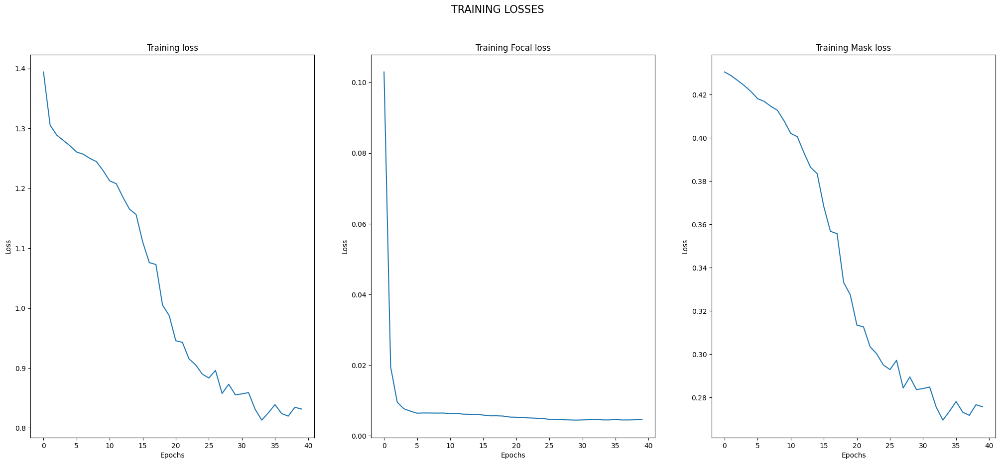

In [30]:
# Load the training losses from saved .pth files
training_loss = torch.load("/losses/epoch_39/training_loss.pth")
training_focal_loss = torch.load("/losses/epoch_39/training_focal_loss.pth")
training_mask_loss = torch.load("/losses/epoch_39/training_mask_loss.pth")

# Combine all the loaded losses into a list
all_losses = [training_loss, training_focal_loss, training_mask_loss]

# Define the labels for each loss to be used in the plots
axes_labels = ["Training loss", "Training Focal loss", "Training Mask loss"]

# Use the plot_func to visualize the losses
plot_func(all_losses, axes_labels, "Training Losses")

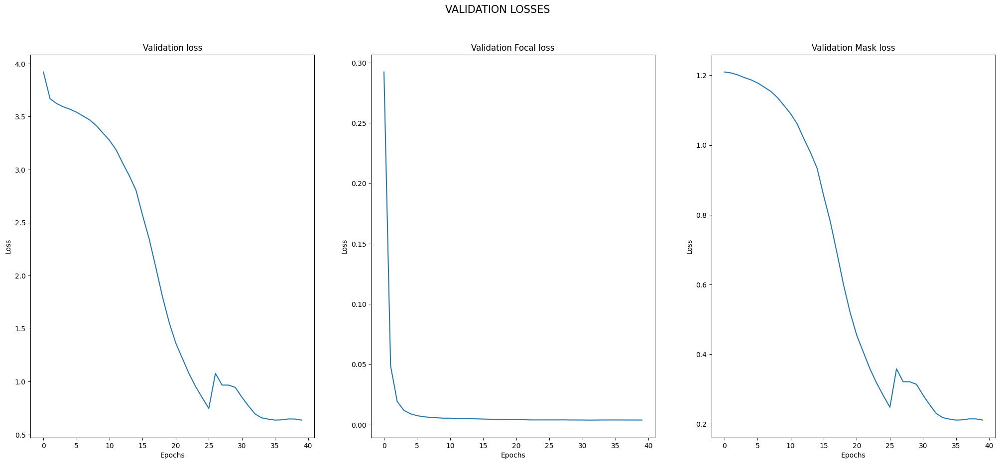

In [31]:
# Load the validation losses from saved .pth files
validation_loss = torch.load("/losses/epoch_39/validation_loss.pth")
validation_focal_loss = torch.load("/losses/epoch_39/validation_focal_loss.pth")
validation_mask_loss = torch.load("/losses/epoch_39/validation_mask_loss.pth")

# Combine all the loaded validation losses into a list
all_losses = [validation_loss, validation_focal_loss, validation_mask_loss]

# Define the labels for each loss to be used in the plots
axes_labels = ["Validation loss", "Validation Focal loss", "Validation Mask loss"]

# Use the plot_func to visualize the validation losses
plot_func(all_losses, axes_labels, "Validation Losses")

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

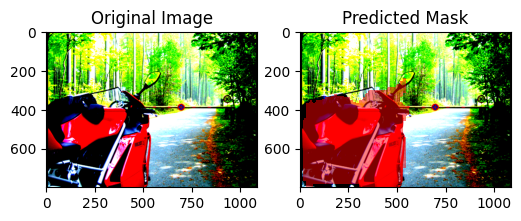

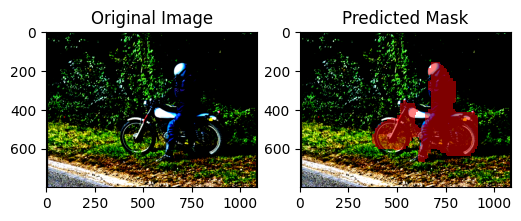

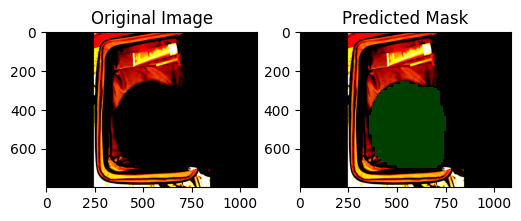

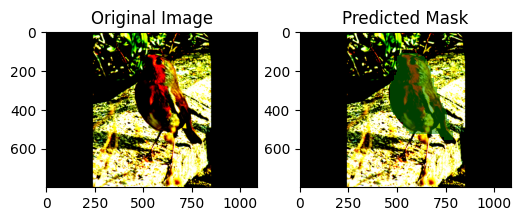

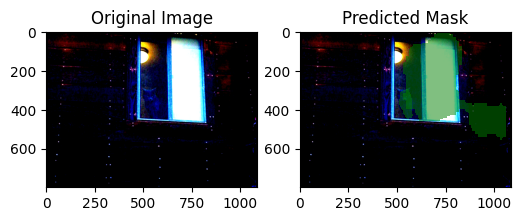

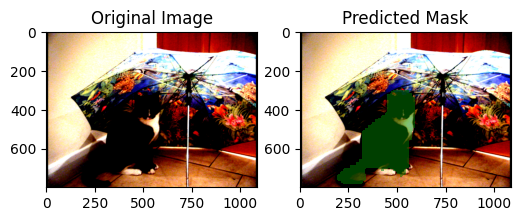

In [32]:
# Manually trigger the garbage collector to free up memory
gc.collect()

# Determine if CUDA (GPU) is available and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the SOLO model from the specified checkpoint and move it to the chosen device (GPU or CPU)
solo_model = SOLO().load_from_checkpoint('epoch=39-step=52240.ckpt').to(device)

# Initialize the SoloDataModule with the provided dataset and a batch size of 2
data_module = SoloDataModule(dataset, batch_size=2)

# Prepare the data and potentially split it into training, validation, and test sets
data_module.setup()

# Post-process the model's predictions on the validation set and visualize the results
post_process_images(data_module, solo_model)

# Discussion

1. Due to limited computational power, used only a batch size of 2. This limitation hindered the model's ability to converge smoothly, requiring more epochs for thorough training and assessment.

2. Training the model for 40 epochs across all images was time-consuming, impacting its performance. Our limited computational power and time constraints prevented us from extending the training duration, leading to notable errors.

3. The class imbalance in our dataset posed a major hurdle, particularly with the limited number of images of individuals. This caused the model to have difficulties in accurately segmenting persons.